In [115]:
#import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pio.templates.default = "plotly_white"
import seaborn as sns


In [116]:
#load data
df= pd.read_csv (r'C:\Users\Tombra\Infectious-diseases-in-California\california infectious disease.csv')

In [117]:
#display the dataframe
df.head()

,Disease,County,Year,Sex,Cases,Population,Lower_95%_CI,Upper_95%_CI,Rate
0,Amebiasis,ALAMEDA,2001,FEMALE,7.0,746596,0.377,1.932,0.938*
1,Amebiasis,ALAMEDA,2001,MALE,9.0,718968,0.572,2.376,1.252*
2,Amebiasis,ALAMEDA,2001,TOTAL,16.0,1465564,0.624,1.773,1.092*
3,Anaplasmosis and Ehrlichiosis,ALAMEDA,2001,FEMALE,0.0,746596,0.000,0.494,-
4,Anaplasmosis and Ehrlichiosis,ALAMEDA,2001,MALE,0.0,718968,0.000,0.513,-


In [118]:
#display the rows and columns in the dataframe
df.shape

(151728, 9)

In [120]:
#check for null values
df.isnull().sum()

Disease            0
County             0
Year               0
Sex                0
Cases           3742
Population         0
Lower_95%_CI    4252
Upper_95%_CI    4252
Rate               0
dtype: int64

In [121]:
df['Percentage'] = df['Cases'] / df['Population'] * 100

In [122]:
#statistical analysis on the dataframe
df.describe()

,Year,Cases,Population,Lower_95%_CI,Upper_95%_CI,Percentage
count,151728.000000,147986.000000,1.517280e+05,147476.000000,147476.000000,147986.000000
mean,2009.788991,5.231637,4.297478e+05,0.659347,22.391640,0.001013
std,5.190337,42.956527,1.016237e+06,5.313068,74.533144,0.006254
min,2001.000000,0.000000,5.630000e+02,0.000000,0.036000,0.000000
25%,2005.000000,0.000000,2.857100e+04,0.000000,1.355000,0.000000
50%,2010.000000,0.000000,1.132980e+05,0.000000,4.162000,0.000000
75%,2014.000000,0.000000,4.082290e+05,0.000000,15.226250,0.000000
max,2018.000000,2937.000000,1.027884e+07,344.974000,653.077000,0.375097


In [123]:
# Calculate the mean of each column
mean_values = df.mean(numeric_only=True)

# Fill null values with the mean of each column
df_filled = df.fillna(mean_values)


In [124]:
#view the new dataframe
df_filled

,Disease,County,Year,Sex,Cases,Population,Lower_95%_CI,Upper_95%_CI,Rate,Percentage
0,Amebiasis,ALAMEDA,2001,FEMALE,7.0,746596,0.377,1.932,0.938*,0.000938
1,Amebiasis,ALAMEDA,2001,MALE,9.0,718968,0.572,2.376,1.252*,0.001252
2,Amebiasis,ALAMEDA,2001,TOTAL,16.0,1465564,0.624,1.773,1.092*,0.001092
3,Anaplasmosis and Ehrlichiosis,ALAMEDA,2001,FEMALE,0.0,746596,0.000,0.494,-,0.000000
4,Anaplasmosis and Ehrlichiosis,ALAMEDA,2001,MALE,0.0,718968,0.000,0.513,-,0.000000
...,...,...,...,...,...,...,...,...,...,...
151723,Yersiniosis,YUBA,2018,MALE,0.0,38838,0.000,9.498,-,0.000000
151724,Yersiniosis,YUBA,2018,TOTAL,0.0,77494,0.000,4.760,-,0.000000
151725,Zika Virus Infection,YUBA,2018,FEMALE,0.0,38656,0.000,9.542,-,0.000000
151726,Zika Virus Infection,YUBA,2018,MALE,0.0,38838,0.000,9.498,-,0.000000


In [125]:
#check if there are still null values
df_filled.isnull().sum()

Disease         0
County          0
Year            0
Sex             0
Cases           0
Population      0
Lower_95%_CI    0
Upper_95%_CI    0
Rate            0
Percentage      0
dtype: int64

In [126]:
df_filled.tail(25)

,Disease,County,Year,Sex,Cases,Population,Lower_95%_CI,Upper_95%_CI,Rate,Percentage
151703,Streptococcal Infection (cases in food and dai...,YUBA,2018,TOTAL,0.0,77494,0.0,4.760,-,0.0
151704,Trichinosis,YUBA,2018,FEMALE,0.0,38656,0.0,9.542,-,0.0
151705,Trichinosis,YUBA,2018,MALE,0.0,38838,0.0,9.498,-,0.0
151706,Trichinosis,YUBA,2018,TOTAL,0.0,77494,0.0,4.760,-,0.0
151707,Tularemia,YUBA,2018,FEMALE,0.0,38656,0.0,9.542,-,0.0
151708,Tularemia,YUBA,2018,MALE,0.0,38838,0.0,9.498,-,0.0
151709,Tularemia,YUBA,2018,TOTAL,0.0,77494,0.0,4.760,-,0.0
151710,Typhoid Fever,YUBA,2018,FEMALE,0.0,38656,0.0,9.542,-,0.0
151711,Typhoid Fever,YUBA,2018,MALE,0.0,38838,0.0,9.498,-,0.0
151712,Typhoid Fever,YUBA,2018,TOTAL,0.0,77494,0.0,4.760,-,0.0


In [127]:
df.dtypes

Disease          object
County           object
Year              int64
Sex              object
Cases           float64
Population        int64
Lower_95%_CI    float64
Upper_95%_CI    float64
Rate             object
Percentage      float64
dtype: object

In [128]:
# Grouping and aggregating the data
disease_county_grouped = df_filled.groupby(['Disease', 'County'])['Cases'].sum().reset_index()


In [129]:
disease_county_grouped

,Disease,County,Cases
0,Amebiasis,ALAMEDA,864.000000
1,Amebiasis,ALPINE,0.000000
2,Amebiasis,AMADOR,0.000000
3,Amebiasis,BUTTE,54.000000
4,Amebiasis,CALAVERAS,12.463274
...,...,...,...
3359,Zika Virus Infection,TULARE,12.000000
3360,Zika Virus Infection,TUOLUMNE,0.000000
3361,Zika Virus Infection,VENTURA,18.000000
3362,Zika Virus Infection,YOLO,12.000000


In [130]:
# Calculate total cases for each disease in each county
disease_county_grouped = df_filled.groupby(['Disease', 'County'])['Cases'].sum().reset_index(name='Total cases')

# Plot a pie chart to visualize the diseases by cases
import plotly.express as px
pie_chart = px.pie(disease_county_grouped, values='Total cases', names='County',
                   title='Disease Cases by County', hole=0,
                   hover_data=['Total cases'])

pie_chart.update_traces(textposition='inside', textinfo='percent+label')
pie_chart.show()


In [131]:


# Calculate total cases for each disease in each county
disease_county_grouped = df_filled.groupby(['Disease', 'Sex'])['Cases'].sum().reset_index(name='Total cases')

# Filter the data for 'MALE' and 'FEMALE'
male_cases = disease_county_grouped[disease_county_grouped['Sex'] == 'MALE']['Total cases'].sum()
female_cases = disease_county_grouped[disease_county_grouped['Sex'] == 'FEMALE']['Total cases'].sum()

# Create a pie chart to visualize the distribution
labels = ['MALE', 'FEMALE']
values = [male_cases, female_cases]

fig = px.pie(values=values, names=labels, title='Disease Cases by Sex')
fig.show()


In [133]:
# Calculate total cases for each disease in each year
disease_year_grouped = df_filled.groupby(['Disease', 'Year'])['Cases'].sum().reset_index(name='Total cases')

# Calculate the total cases for all years
total_cases_all_years = disease_year_grouped['Total cases'].sum()

# Calculate the percentage of cases for each year
disease_year_grouped['Percentage'] = (disease_year_grouped['Total cases'] / total_cases_all_years) * 100

# Create a pie chart to visualize the diseases by year
fig = px.pie(disease_year_grouped, values='Total cases', names='Year',
             title='Disease Cases by Year', hole=0.4,
             hover_data=['Total cases'])

# Add custom text labels for percentage values
percentage_labels = [f"{year} ({percentage:.2f}%)" for year, percentage in zip(disease_year_grouped['Year'], disease_year_grouped['Percentage'])]
fig.update_traces(textinfo='percent+label', text=percentage_labels)

fig.show()


In [134]:
# Calculate total cases for each disease in each year
disease_year_grouped = df_filled.groupby(['Disease', 'Year'])['Cases'].sum().reset_index(name='Total cases')

# Create a pie chart to visualize the diseases by year
pie_chart = px.pie(disease_year_grouped, values='Total cases', names='Year',
                   title='Disease Cases by Year', hole=0,
                   hover_data=['Total cases'])

# Format labels to include the percentage
pie_chart.update_traces(textinfo='percent+label')

pie_chart.show()


In [135]:
# Calculate total cases for each disease in each county
disease_county_grouped = df_filled.groupby(['Disease', 'Year'])['Cases'].sum().reset_index(name='Total cases')

# Plot a pie chart to visualize the diseases by cases
import plotly.express as px
pie_chart = px.pie(disease_county_grouped, values='Total cases', names='Year',
                   title='Disease Cases by Year', hole=0,
                   hover_data=['Total cases'])

pie_chart.update_traces(textposition='inside', textinfo='percent+label')
pie_chart.show()

In [136]:
unique_values= df_filled ['Rate'].unique()
unique_values

array(['0.938*', '1.252*', '1.092*', ..., '6.452*', '20.647', '7.743*'],
      dtype=object)

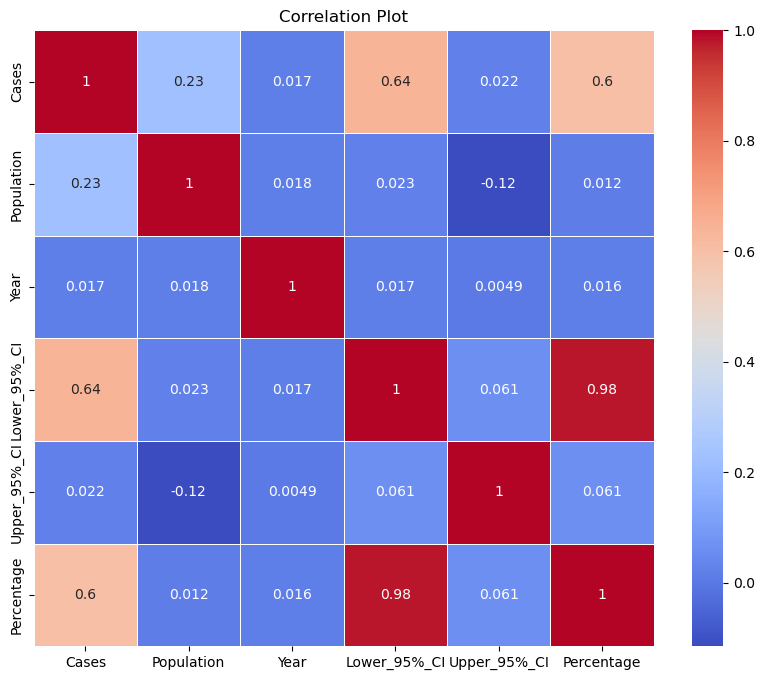

In [137]:
# select numerical columns for correlation analysis
numerical_columns = ['Cases', 'Population', 'Year','Lower_95%_CI', 'Upper_95%_CI', 'Percentage']

# Create a correlation matrix
correlation_matrix = df_filled[numerical_columns].corr()

# Create a heatmap to visualize the correlations
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Plot')
plt.show()


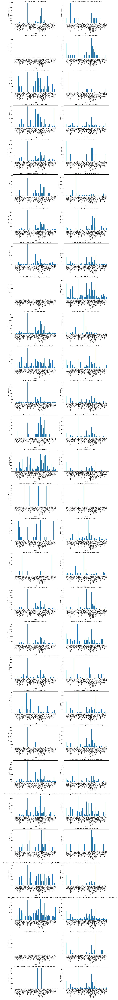

In [138]:
# Grouping and aggregating the data
disease_county_grouped = df_filled.groupby(['Disease', 'County'])['Cases'].sum().reset_index()

# Get a list of all unique diseases in the dataset
all_diseases = df_filled['Disease'].unique()

# Calculate the total number of subplots required
num_diseases = len(all_diseases)
num_rows = (num_diseases + 1) // 2  # To arrange plots in two columns
num_cols = 2

# Create subplots for each disease
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))

# Flatten the axs array to easily iterate through the subplots
axs = axs.flatten()

# Loop through all diseases and create individual bar plots
for i, disease in enumerate(all_diseases):
    # Filter the data for the current disease
    selected_disease_data = disease_county_grouped[disease_county_grouped['Disease'] == disease]

    # Create the bar plot on the current subplot
    axs[i].bar(selected_disease_data['County'], selected_disease_data['Cases'])
    axs[i].set_xlabel('County')
    axs[i].set_ylabel('Number of Cases')
    axs[i].set_title(f'Number of {disease} cases by County')
    axs[i].tick_params(axis='x', rotation=90)

# Adjust the layout to prevent overlapping of subplots
plt.tight_layout()

# Show the plot
plt.show()


In [139]:
# Use boolean indexing to filter out rows with 'Yellow Fever', 'Anthrax', and 'Domoic Acid Poisoning' in the 'Disease' column because they dont have data
filtered_diseases = ['Yellow Fever', 'Anthrax', 'Domoic Acid Poisoning']
df_filtered = df_filled[~df_filled['Disease'].isin(filtered_diseases)]

# Now df_filtered contains the rows without the specified diseases in the 'Disease' column


In [141]:
df_filtered

,Disease,County,Year,Sex,Cases,Population,Lower_95%_CI,Upper_95%_CI,Rate,Percentage
0,Amebiasis,ALAMEDA,2001,FEMALE,7.0,746596,0.377,1.932,0.938*,0.000938
1,Amebiasis,ALAMEDA,2001,MALE,9.0,718968,0.572,2.376,1.252*,0.001252
2,Amebiasis,ALAMEDA,2001,TOTAL,16.0,1465564,0.624,1.773,1.092*,0.001092
3,Anaplasmosis and Ehrlichiosis,ALAMEDA,2001,FEMALE,0.0,746596,0.000,0.494,-,0.000000
4,Anaplasmosis and Ehrlichiosis,ALAMEDA,2001,MALE,0.0,718968,0.000,0.513,-,0.000000
...,...,...,...,...,...,...,...,...,...,...
151723,Yersiniosis,YUBA,2018,MALE,0.0,38838,0.000,9.498,-,0.000000
151724,Yersiniosis,YUBA,2018,TOTAL,0.0,77494,0.000,4.760,-,0.000000
151725,Zika Virus Infection,YUBA,2018,FEMALE,0.0,38656,0.000,9.542,-,0.000000
151726,Zika Virus Infection,YUBA,2018,MALE,0.0,38838,0.000,9.498,-,0.000000


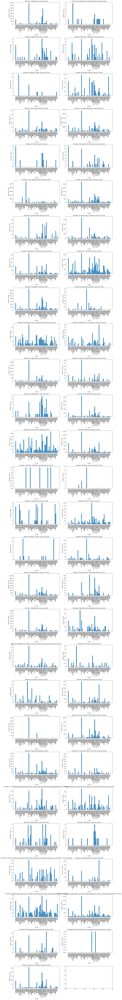

In [142]:
# Grouping and aggregating the data
disease_county_grouped = df_filtered.groupby(['Disease', 'County'])['Cases'].sum().reset_index()

# Get a list of all unique diseases in the dataset
all_diseases = df_filtered['Disease'].unique()

# Calculate the total number of subplots required
num_diseases = len(all_diseases)
num_rows = (num_diseases + 1) // 2  # To arrange plots in two columns
num_cols = 2

# Create subplots for each disease
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))

# Flatten the axs array to easily iterate through the subplots
axs = axs.flatten()

# Loop through all diseases and create individual bar plots
for i, disease in enumerate(all_diseases):
    # Filter the data for the current disease
    selected_disease_data = disease_county_grouped[disease_county_grouped['Disease'] == disease]

    # Create the bar plot on the current subplot
    axs[i].bar(selected_disease_data['County'], selected_disease_data['Cases'])
    axs[i].set_xlabel('County')
    axs[i].set_ylabel('Number of Cases')
    axs[i].set_title(f'Number of {disease} cases by County')
    axs[i].tick_params(axis='x', rotation=90)

# Adjust the layout to prevent overlapping of subplots
plt.tight_layout()

# Show the plot
plt.show()

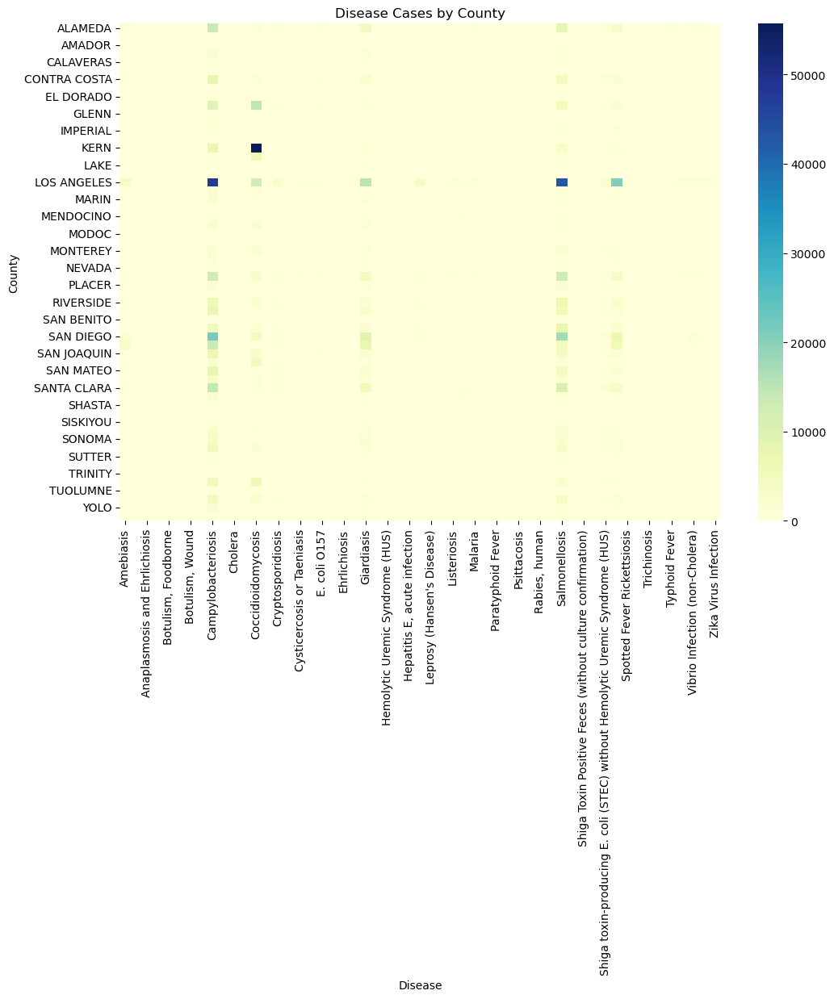

In [143]:
# pivot the data to prepare it for a heatmap
heatmap_data = df_filtered.pivot_table(index='County', columns='Disease', values='Cases', aggfunc='sum')

# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap="YlGnBu")
plt.title("Disease Cases by County")
plt.show()


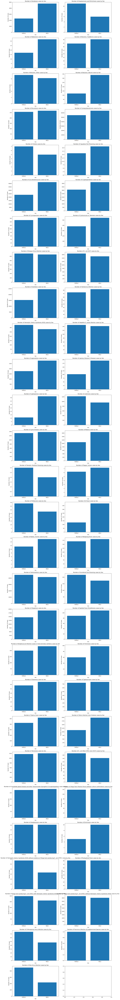

In [144]:
# Grouping and aggregating the data
disease_county_grouped = df_filtered.groupby(['Disease', 'Sex'])['Cases'].sum().reset_index()

# Get a list of all unique diseases in the dataset
all_diseases = df_filtered['Disease'].unique()

# Calculate the total number of subplots required
num_diseases = len(all_diseases)
num_rows = (num_diseases + 1) // 2  # To arrange plots in two columns
num_cols = 2

# Create subplots for each disease
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))

# Flatten the axs array to easily iterate through the subplots
axs = axs.flatten()

# Loop through all diseases and create individual bar plots
for i, disease in enumerate(all_diseases):
    # Filter the data for the current disease and 'MALE' and 'FEMALE' Sex while excluding 'TOTAL'
    selected_disease_data = disease_county_grouped[(disease_county_grouped['Disease'] == disease) & (disease_county_grouped['Sex'].isin(['MALE', 'FEMALE']))]

    # Create the bar plot on the current subplot
    axs[i].bar(selected_disease_data['Sex'], selected_disease_data['Cases'])
    axs[i].set_xlabel('Sex')
    axs[i].set_ylabel('Number of Cases')
    axs[i].set_title(f'Number of {disease} cases by Sex')
    axs[i].tick_params(axis='x', rotation=0)

# Adjust the layout to prevent overlapping of subplots
plt.tight_layout()

# Show the plot
plt.show()


In [145]:
df['Year']

0         2001
1         2001
2         2001
3         2001
4         2001
          ... 
151723    2018
151724    2018
151725    2018
151726    2018
151727    2018
Name: Year, Length: 151728, dtype: int64

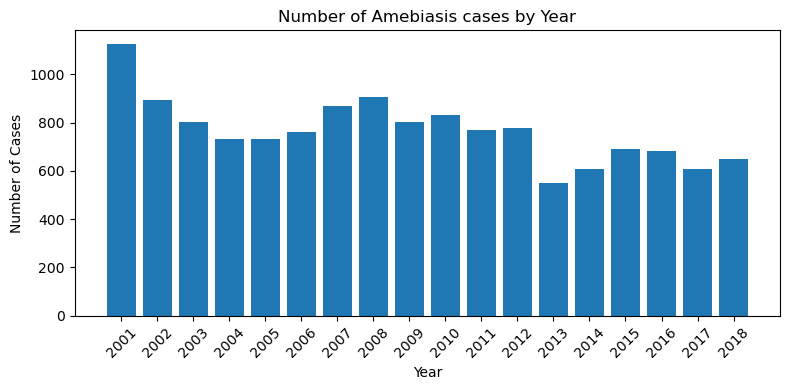

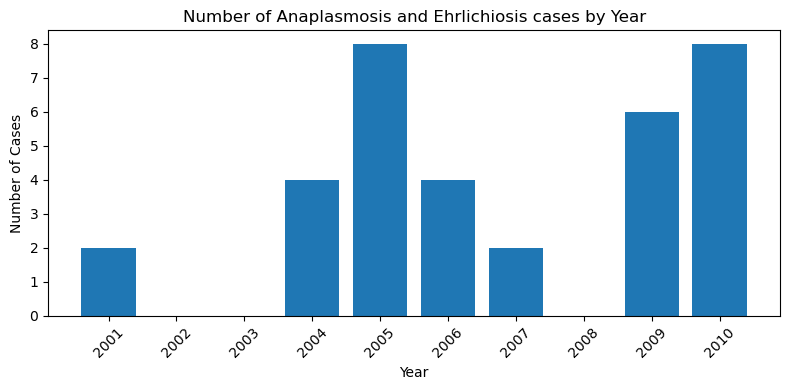

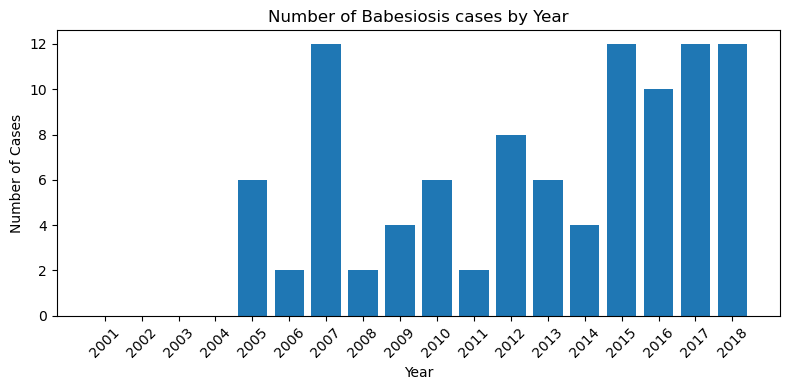

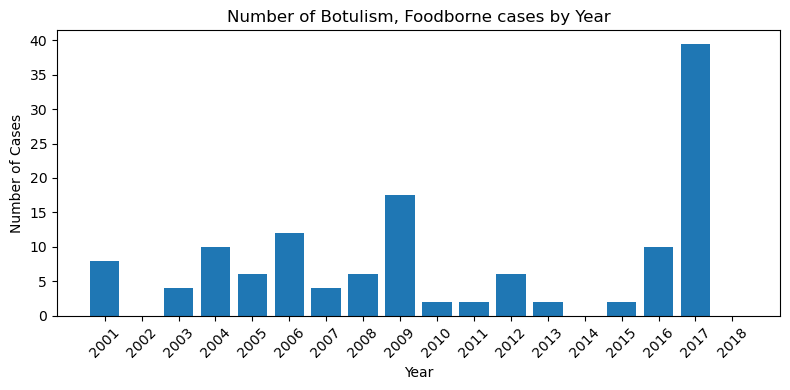

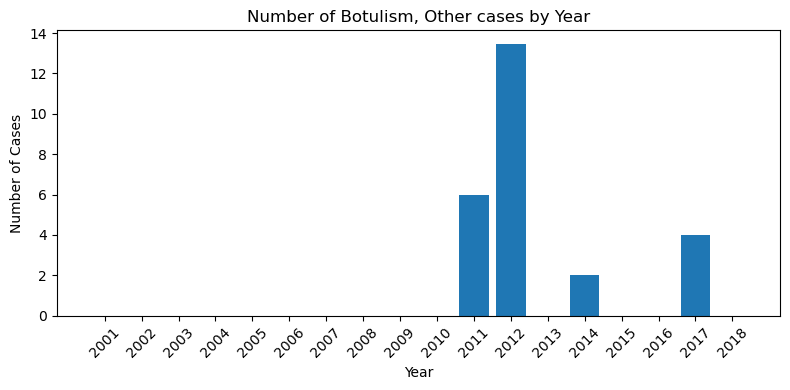

...

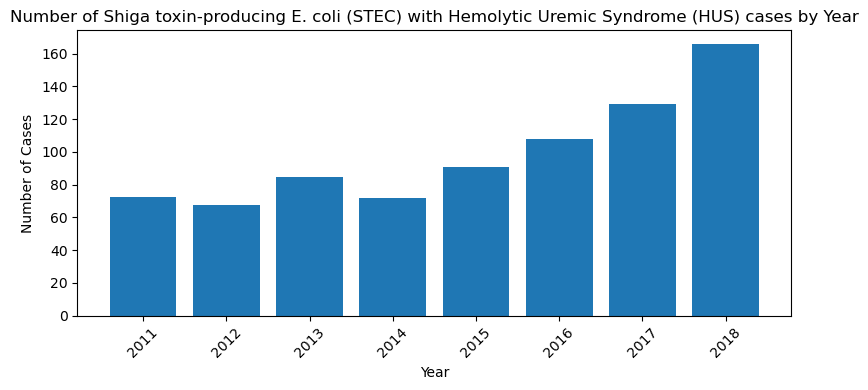

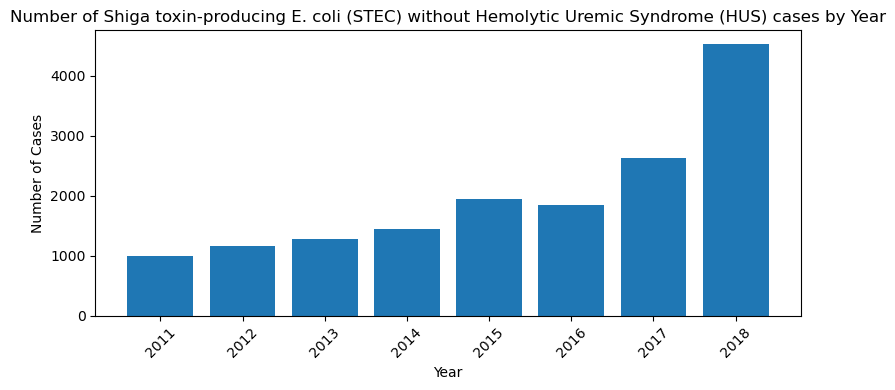

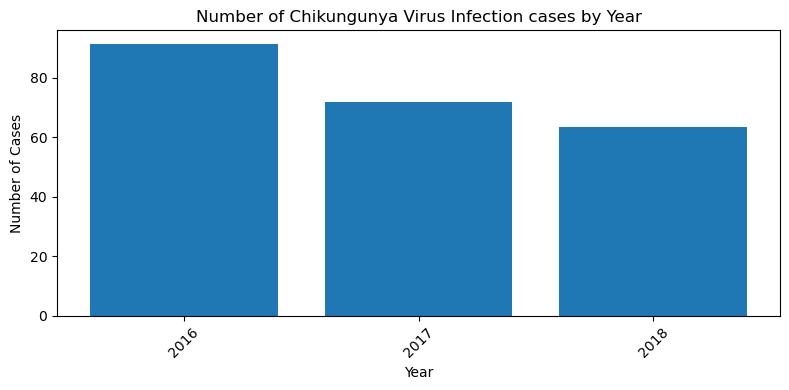

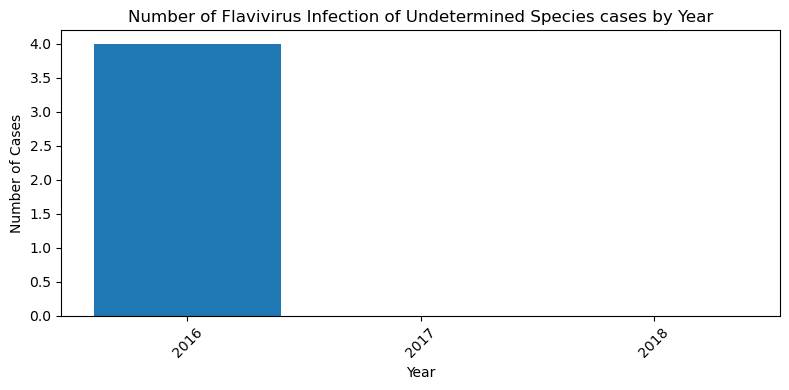

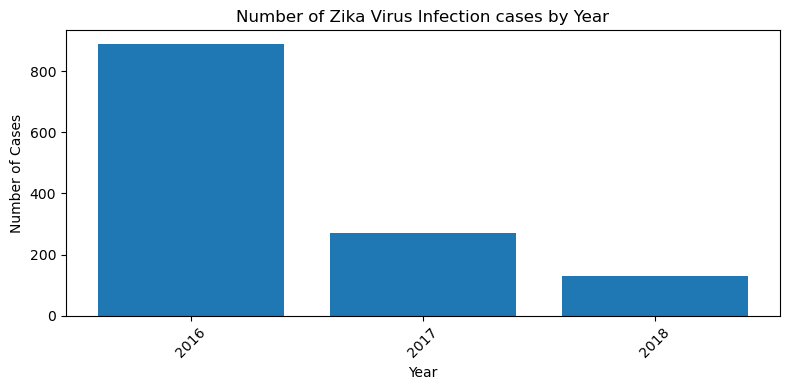

In [146]:
# Grouping and aggregating the data
disease_county_grouped = df_filtered.groupby(['Year', 'Disease'])['Cases'].sum().reset_index()

# Convert the "Year" column to integer to avoid decimal display
disease_county_grouped['Year'] = disease_county_grouped['Year'].astype(int)

# Get a list of all unique diseases in the dataset
all_diseases = disease_county_grouped['Disease'].unique()

# Loop through all diseases and create individual bar plots
for disease in all_diseases:
    # Filter the data for the current disease
    data = disease_county_grouped[disease_county_grouped['Disease'] == disease]

    # Create the bar plot
    plt.figure(figsize=(8, 4))
    plt.bar(data['Year'], data['Cases'])
    plt.xlabel('Year')
    plt.ylabel('Number of Cases')
    plt.title(f'Number of {disease} cases by Year')
    plt.xticks(data['Year'].unique(), rotation=45)  # Set x-axis ticks to unique years with 45-degree rotation
    plt.grid(False)
    plt.tight_layout()
    plt.show()


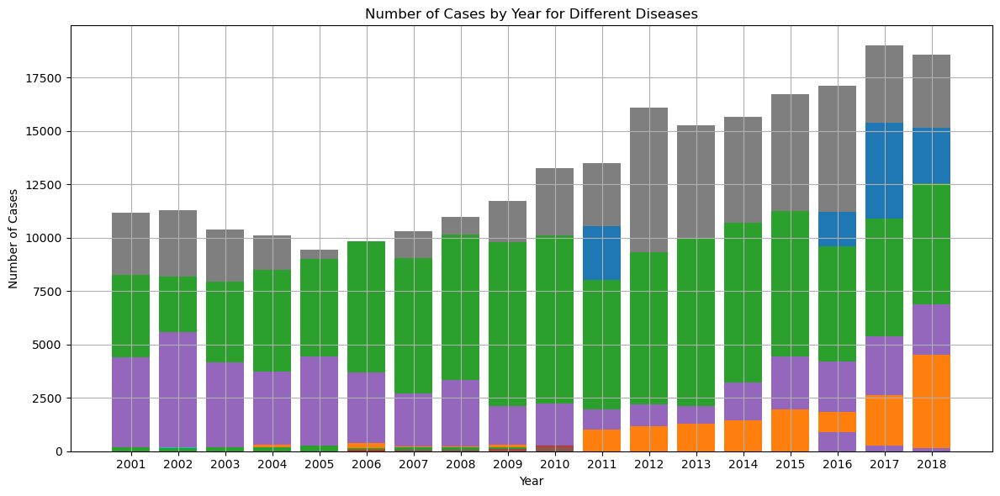

In [147]:
# Grouping and aggregating the data
disease_county_grouped = df_filtered.groupby(['Year', 'Disease'])['Cases'].sum().reset_index()

# Convert the "Year" column to integer to avoid decimal display
disease_county_grouped['Year'] = disease_county_grouped['Year'].astype(int)

# Create the bar plot
plt.figure(figsize=(12, 6))
for disease in disease_county_grouped['Disease'].unique():
    data = disease_county_grouped[disease_county_grouped['Disease'] == disease]
    plt.bar(data['Year'], data['Cases'], label=disease)

plt.xlabel('Year')
plt.ylabel('Number of Cases')
plt.title('Number of Cases by Year for Different Diseases')
plt.xticks(disease_county_grouped['Year'].unique())  # Set x-axis ticks to unique years
#plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


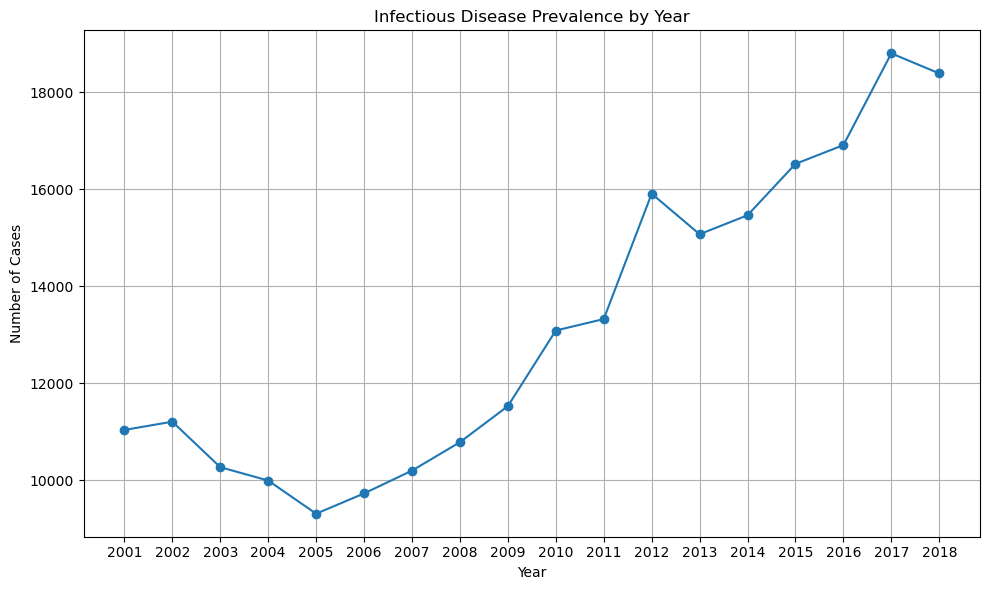

In [148]:
# Grouping and aggregating the data to get the total cases for each disease in each year
disease_year_grouped = df.groupby(['Disease', 'Year'])['Cases'].sum().reset_index()

# Find the prevalent disease for each year
disease_prevalence = disease_year_grouped.loc[disease_year_grouped.groupby('Year')['Cases'].idxmax()]

# Create a line plot or bar plot to visualize the prevalent disease by year
plt.figure(figsize=(10, 6))
plt.plot(disease_prevalence['Year'], disease_prevalence['Cases'], marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Number of Cases')
plt.xticks(disease_county_grouped['Year'].unique())  # Set x-axis ticks to unique years
plt.title('Infectious Disease Prevalence by Year')
plt.grid(True)
plt.tight_layout()
plt.show()


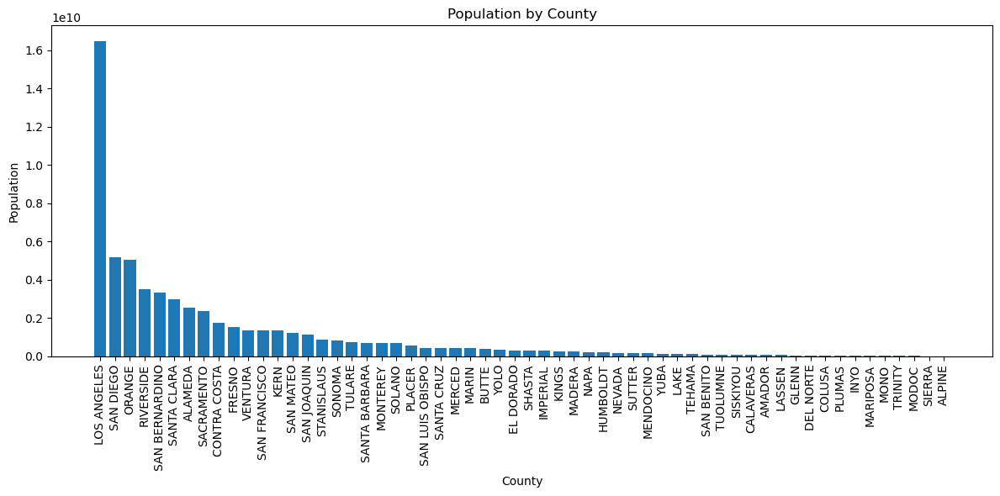

In [113]:
# Grouping and aggregating the data
county_population = df_filtered.groupby('County')['Population'].sum().reset_index()

# Sort the data by population in descending order for better visualization
county_population = county_population.sort_values(by='Population', ascending=False)

# Create the bar plot
plt.figure(figsize=(12, 6))
plt.bar(county_population['County'], county_population['Population'])
plt.xlabel('County')
plt.ylabel('Population')
plt.title('Population by County')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.grid(False)
plt.tight_layout()
plt.show()


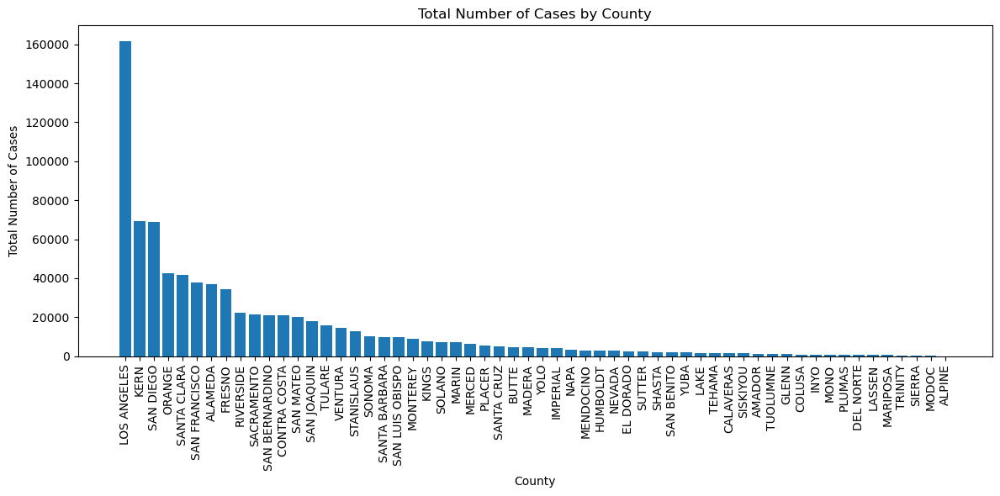

In [151]:
#determining the county with the highest infections

# Grouping and aggregating the data to calculate the summation of cases by county
county_cases_sum = df_filtered.groupby('County')['Cases'].sum().reset_index()
df_sorted = county_cases_sum.sort_values(by='Cases', ascending=False)

# Create the bar plot
plt.figure(figsize=(12, 6))
plt.bar(df_sorted['County'], df_sorted['Cases'])
plt.xlabel('County')
plt.ylabel('Total Number of Cases')
plt.title('Total Number of Cases by County')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.grid(False)
plt.tight_layout()
plt.show()


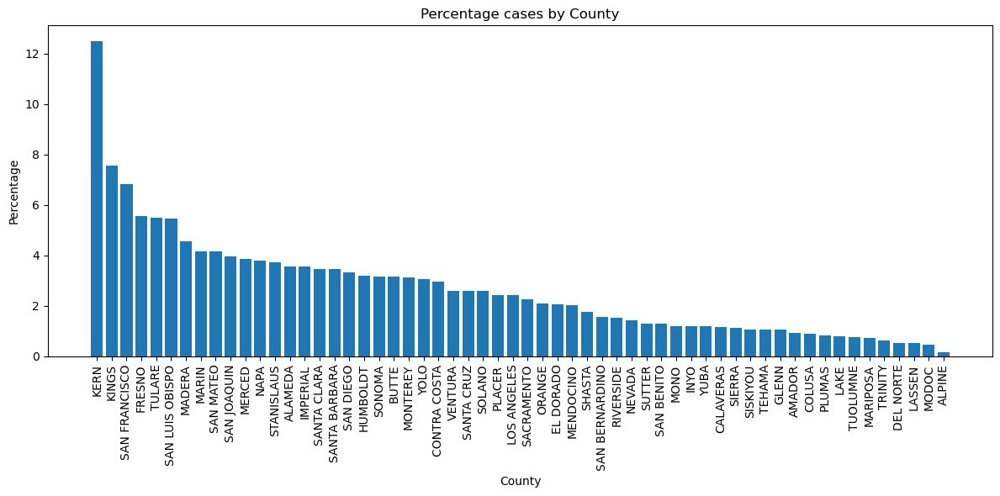

In [152]:
# Grouping and aggregating the data
county_population = df_filtered.groupby('County')['Percentage'].sum().reset_index()

# Sort the data by population in descending order for better visualization
county_population = county_population.sort_values(by='Percentage', ascending=False)

# Create the bar plot
plt.figure(figsize=(12, 6))
plt.bar(county_population['County'], county_population['Percentage'])
plt.xlabel('County')
plt.ylabel('Percentage')
plt.title('Percentage cases by County')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.grid(False)
plt.tight_layout()
plt.show()

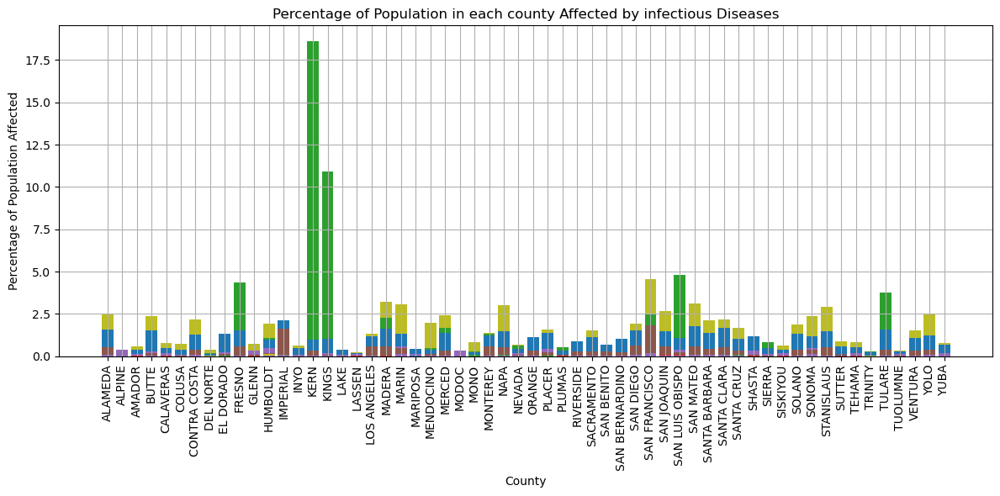

In [153]:
#determining the percentage of the population per county that is affected by infectious disease

# Grouping and aggregating the data
disease_county_grouped = df_filtered.groupby(['County', 'Disease'])['Percentage'].mean().reset_index()

# Create the bar plot
plt.figure(figsize=(12, 6))
for disease in disease_county_grouped['Disease'].unique():
    data = disease_county_grouped[disease_county_grouped['Disease'] == disease]
    plt.bar(data['County'], data['Percentage']*100, label=disease)

plt.xlabel('County')
plt.ylabel('Percentage of Population Affected')
plt.title('Percentage of Population in each county Affected by infectious Diseases')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
#plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [154]:
#Determining the top 5 counties with largest number of cases

# Grouping and aggregating the data to calculate the summation of cases by county
county_cases_sum = df_filtered.groupby('County')['Cases'].sum().reset_index()
df_sorted = county_cases_sum.sort_values(by= 'Cases', ascending= False)
df_sorted.head(5)

,County,Cases
18,LOS ANGELES,161566.0
14,KERN,69199.0
36,SAN DIEGO,69076.0
29,ORANGE,42736.0
42,SANTA CLARA,41876.0


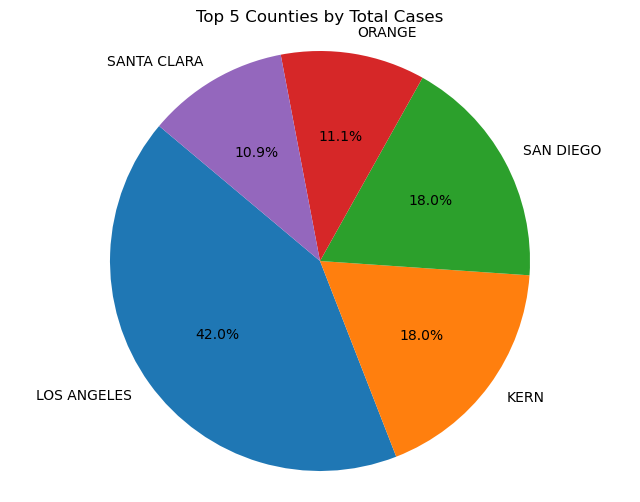

In [156]:

# df_sorted contains the top 5 counties and their total cases
top_counties = df_sorted.head(5)

# Extract the county names and their respective cases
counties = top_counties['County']
cases = top_counties['Cases']

# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(cases, labels=counties, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Counties by Total Cases')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the pie chart
plt.show()


In [160]:
#Determining the 5 counties with least number of cases

# Grouping and aggregating the data to calculate the summation of cases by county
county_cases_sum = df_filtered.groupby('County')['Cases'].sum().reset_index()
df_sorted = county_cases_sum.sort_values(by= 'Cases', ascending= False)
df_sorted.tail(5)

,County,Cases
21,MARIPOSA,574.384036
52,TRINITY,398.361480
45,SIERRA,224.338924
24,MODOC,218.875650
1,ALPINE,12.463274


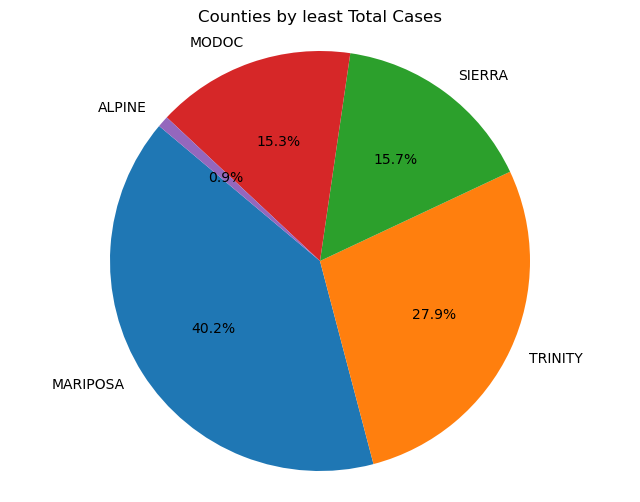

In [159]:

# df_sorted contains the top 5 counties and their total cases
top_counties = df_sorted.tail(5)

# Extract the county names and their respective cases
counties = top_counties['County']
cases = top_counties['Cases']

# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(cases, labels=counties, autopct='%1.1f%%', startangle=140)
plt.title('Counties by least Total Cases')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the pie chart
plt.show()

In [163]:
#Determining the 5 year with least number of cases

# Grouping and aggregating the data to calculate the summation of cases by county
county_cases_sum = df_filtered.groupby('Year')['Cases'].sum().reset_index()
df_sorted = county_cases_sum.sort_values(by= 'Cases', ascending= False)
df_sorted.tail(5)

,Year,Cases
8,2009,37128.790629
6,2007,37122.841526
4,2005,37105.598611
3,2004,35871.061884
2,2003,34893.768073


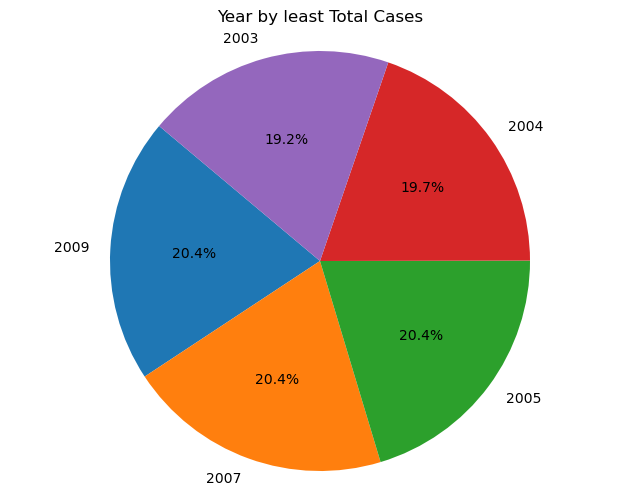

In [164]:
# df_sorted contains the top 5 years and their total cases
top_counties = df_sorted.tail(5)

# Extract the county names and their respective cases
counties = top_counties['Year']
cases = top_counties['Cases']

# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(cases, labels=counties, autopct='%1.1f%%', startangle=140)
plt.title('Year by least Total Cases')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the pie chart
plt.show()

In [165]:
#Determining the 5 year with most number of cases

# Grouping and aggregating the data to calculate the summation of cases by county
county_cases_sum = df_filtered.groupby('Year')['Cases'].sum().reset_index()
df_sorted = county_cases_sum.sort_values(by= 'Cases', ascending= False)
df_sorted.head(5)

,Year,Cases
17,2018,70192.395024
16,2017,65761.248118
15,2016,56287.101212
14,2015,50450.592826
11,2012,45033.937535


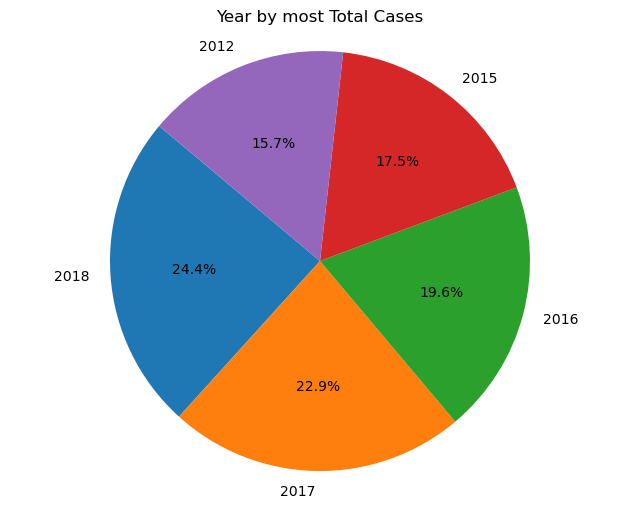

In [168]:
# df_sorted contains the top 5 years and their total cases
top_counties = df_sorted.head(5)

# Extract the county names and their respective cases
counties = top_counties['Year']
cases = top_counties['Cases']

# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(cases, labels=counties, autopct='%1.1f%%', startangle=140)
plt.title('Year by most Total Cases')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the pie chart
plt.show()

In [185]:
#Determining the County with the highest % population infected with disease

# Grouping and aggregating the data to calculate the summation of cases by county
county_cases_sum = df_filtered.groupby('County')['Percentage'].sum().reset_index()
df_sorted_p = county_cases_sum.sort_values(by= 'County', ascending= False)
df_sorted_p.head(5)

,County,Percentage
57,YUBA,1.189072
56,YOLO,3.064901
55,VENTURA,2.602286
54,TUOLUMNE,0.743214
53,TULARE,5.480980


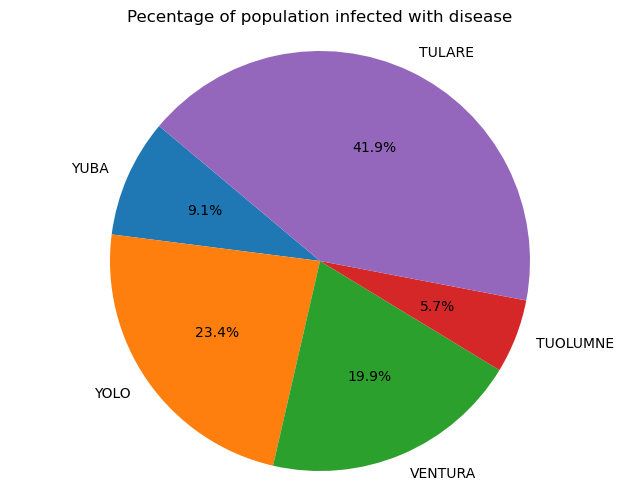

In [186]:
# df_sorted_p contains the top 5 years and their % population
top_counties_p = df_sorted_p.head(5)

# Extract the county names and their respective cases
counties = top_counties_p['County']
cases = top_counties_p['Percentage']

# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(cases, labels=counties, autopct='%1.1f%%', startangle=140)
plt.title('Pecentage of population infected with disease')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the pie chart
plt.show()

In [170]:
df_sorted

,Year,Cases
17,2018,70192.395024
16,2017,65761.248118
15,2016,56287.101212
14,2015,50450.592826
11,2012,45033.937535
13,2014,44187.056100
12,2013,43410.033544
9,2010,43343.106997
10,2011,42622.400808
5,2006,37989.841526
